In [1]:
import librosa
import matplotlib.pyplot as plt
import librosa.display
import numpy as np 
from pyAudioAnalysis import audioBasicIO
import IPython.display as ipd
%matplotlib inline

### 首先对音频进行提取 采样率为22.05k Hz (表示每秒采集的样本数) 如下

In [2]:
filepath = '/home/bob/Music/CloudMusic/'
music_name = 'AGA-Wonderful U.mp3'
filename = filepath + music_name

In [3]:
#load a music

#return a time series:y and sampling rate:sr
y, sr = librosa.load(filename)
print("y为每首歌的时间序列")
print("y.shape:{0}, 采样率:{1}".format(y.shape, sr))

y为每首歌的时间序列
y.shape:(5485452,), 采样率:22050


### 一首歌的波形图是这样的

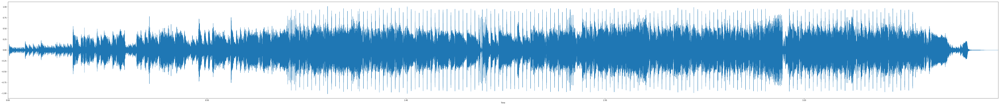

In [5]:
plt.figure(figsize=(100, 10))
librosa.display.waveplot(y, sr)

## 特征提取


节奏特征: 返回每首歌的节奏(按照每分钟预测的节奏) 
        和 检测到节奏发生的帧数位置 或是时间戳数组

In [6]:
#feature axtraction

#return an estimate of the tempo(in beats per minute), type:float
#and the array of frame number, type:numpy.ndarray, shape: (n, )
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)

#converts the frame numbers beat_frames into timings. 
#type:numpy.ndarray shape:(n, )
beat_times = librosa.frames_to_time(beat_frames, sr=sr)
#beat_times将是对应于检测到的节拍事件的时间戳数组(以秒为单位)
interval_sum = 0
for i in range(1, len(beat_times)):
    differ = beat_times[i] - beat_times[i-1]
    interval_sum += differ
beat_interval = interval_sum/len(beat_times)

#print(len(beat_times), type(beat_times), beat_times.shape)
print("当前歌曲每分钟的节奏为:{}\n节奏间隔为:{:.2f}s".format(int(tempo), beat_interval))

/home/bob/anaconda3/lib/python3.7/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


当前歌曲每分钟的节奏为:60
节奏间隔为:1.00s


## 其他特征

In [7]:
chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
chroma_cqt = librosa.feature.chroma_cqt(y=y, sr=sr)
chroma_cens = librosa.feature.chroma_cens(y=y, sr=sr)

melspectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
mfcc = librosa.feature.mfcc(y=y, sr=sr)
rmse = librosa.feature.rmse(y=y)

spectral_cent = librosa.feature.spectral_centroid(y=y, sr=sr)
spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)
S = np.abs(librosa.stft(y))
spectral_contrast = librosa.feature.spectral_contrast(S=S, sr=sr)
#often converted to dB scale.
spectral_flatness = librosa.feature.spectral_flatness(y=y)
spectral_rolloff = librosa.feature.spectral_rolloff(y=y, 
                                sr=sr, roll_percent=0.95)

#获得将n阶多项式拟合到谱图列的系数
p0 = librosa.feature.poly_features(S=S, order=0)
p1 = librosa.feature.poly_features(S=S, order=1) #线性拟合
p2 = librosa.feature.poly_features(S=S, order=2) #平方拟合

#从音频时间序列中提取谐波元素
y_hrmonic = librosa.effects.harmonic(y)
tonnetz = librosa.feature.tonnetz(y=y_hrmonic, sr=sr)

zero_crossing_rate = librosa.feature.zero_crossing_rate(y)

#节拍跟踪器, 返回每分钟估计节拍数量 和 检测到节奏的帧数位置的列表
tempo, beats = librosa.beat.beat_track(y=y, sr=sr)

/home/bob/anaconda3/lib/python3.7/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


In [8]:
print("\
    chroma_stft: shape:{0}\n\
    chroma_cqt: shape:{1}\n\
    chroma_cens: shape:{2}\n\
    melspectrogram: shape:{3}\n\
    mfcc: shape{4}\n\
    rmse: shape{5}\n\
    spectral_cnet: shape{6}\n\
    spectral_bandwidth: shape{7}\n\
    spectral_contrast: shape{8}\n\
    spectral_flatness: shape{9}\n\
    spectral_rolloff: shape{10}\n\
    poly_featrues: shape{11}\n\
    tonnetz: shape{12}\n\
    zero_crossing_rate: shape{13}\n\
    tempo :{14}\n"
      .format(
          chroma_stft.shape, 
          chroma_cqt.shape,
          chroma_cens.shape, 
          melspectrogram.shape,
          mfcc.shape,
          rmse.shape,
          spectral_cent.shape,
          spectral_bandwidth.shape,
          spectral_contrast.shape,
          spectral_flatness.shape,
          spectral_rolloff.shape,
          p0.shape,
          tonnetz.shape,
          zero_crossing_rate.shape,
          tempo
      )
     )

    chroma_stft: shape:(12, 10714)
    chroma_cqt: shape:(12, 10714)
    chroma_cens: shape:(12, 10714)
    melspectrogram: shape:(128, 10714)
    mfcc: shape(20, 10714)
    rmse: shape(1, 10714)
    spectral_cnet: shape(1, 10714)
    spectral_bandwidth: shape(1, 10714)
    spectral_contrast: shape(7, 10714)
    spectral_flatness: shape(1, 10714)
    spectral_rolloff: shape(1, 10714)
    poly_featrues: shape(1, 10714)
    tonnetz: shape(6, 10714)
    zero_crossing_rate: shape(1, 10714)
    tempo :60.09265988372093



### 1.色度图特征 
#### 从波形图中计算色度图 返回( 12 * 时间序列长度 )的矩阵

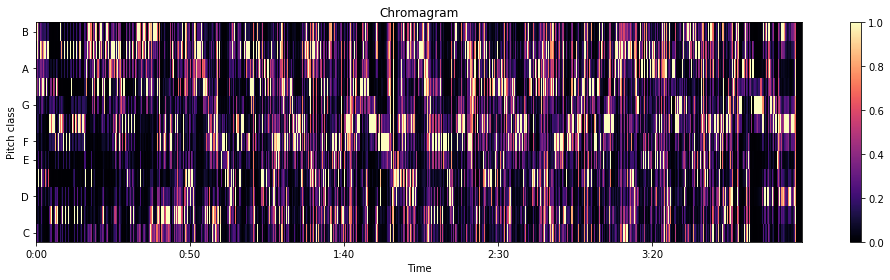

In [9]:
plt.figure(figsize=(14, 4))
librosa.display.specshow(chroma_stft, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram')
plt.tight_layout()

### 2.通过常数-Q转换 得到的色谱图  cqt特征捕获音高
#### 返回 ( 12 * 时间序列长度 ) 的矩阵

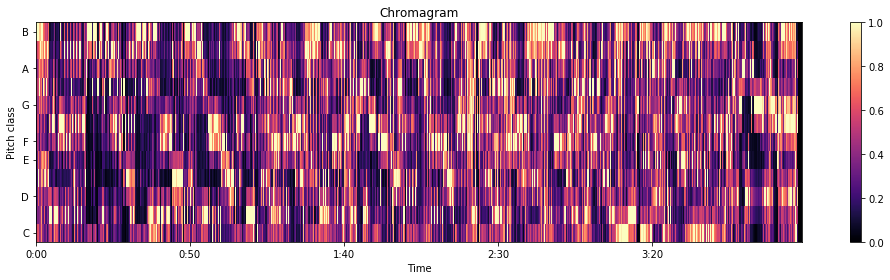

In [10]:
plt.figure(figsize=(14, 4))
librosa.display.specshow(chroma_cqt, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram')
plt.tight_layout()

### 3. 计算色度变量 -- 色度能量归一化
#### 返回 ( 12 * 时间序列长度 ) 的矩阵

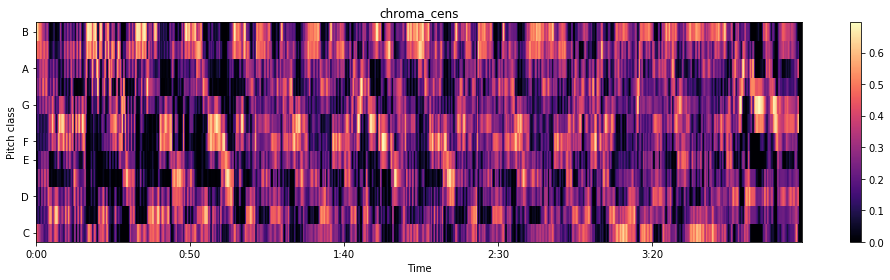

In [11]:
plt.figure(figsize=(14, 4))
librosa.display.specshow(chroma_cens, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('chroma_cens')
plt.tight_layout()

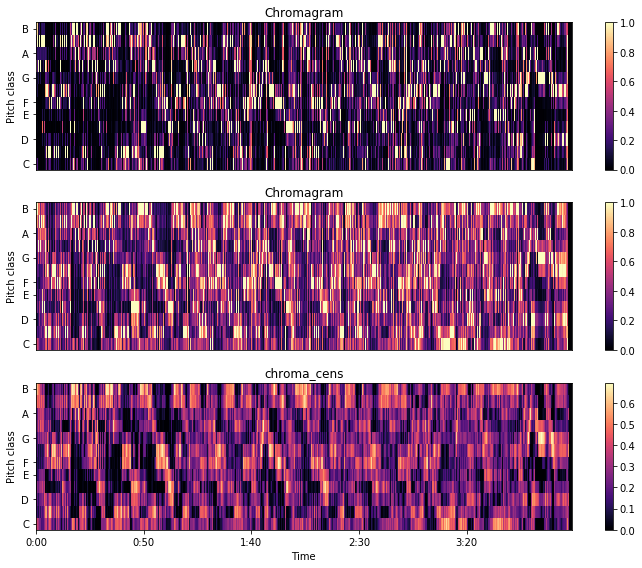

In [12]:
plt.figure(figsize=(10, 8))
plt.subplot(3,1,1)
librosa.display.specshow(chroma_stft, y_axis='chroma')
plt.colorbar()
plt.title('Chromagram')

plt.subplot(3, 1, 2)
librosa.display.specshow(chroma_cqt, y_axis='chroma')
plt.colorbar()
plt.title('Chromagram')

plt.subplot(3, 1, 3)
librosa.display.specshow(chroma_cens, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('chroma_cens')
plt.tight_layout()

### 4.Mel频谱特征
#### 规格为( 128 * 时间序列长度 ) 

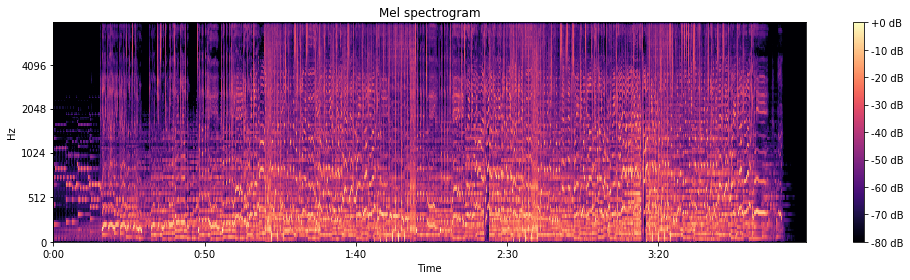

In [13]:
plt.figure(figsize=(14, 4))
librosa.display.specshow(librosa.power_to_db(melspectrogram,ref=np.max), 
                         y_axis='mel', fmax=8000, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel spectrogram')
plt.tight_layout()

### 5.梅尔频率倒谱系数 MFCC
#### 返回( 20 * 时间序列长度 ) 的矩阵 (有的采用12维向量)  (余弦类型变换默认为type-2)

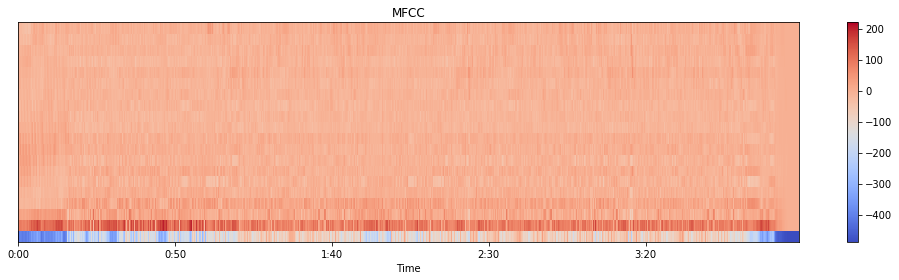

In [14]:
plt.figure(figsize=(14, 4))
librosa.display.specshow(mfcc, x_axis='time')
plt.colorbar()
plt.title('MFCC')
plt.tight_layout()

### 6.计算每一帧的均方根能量
#### 返回 ( 1 * 时间序列长度 )矩阵

In [15]:
S, phase = librosa.magphase(librosa.stft(y))
rms = librosa.feature.rmse(S=S)

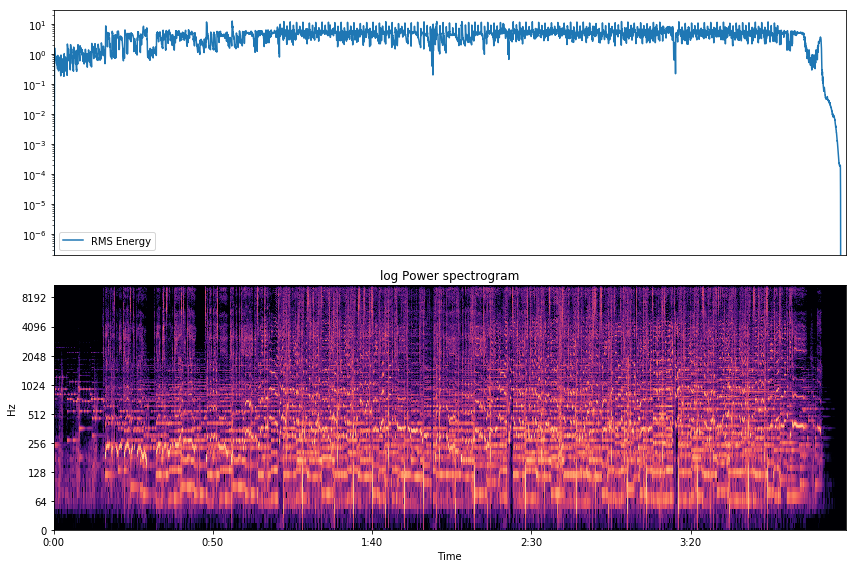

In [16]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.semilogy(rms.T, label='RMS Energy')
plt.xticks([])
plt.xlim([0, rms.shape[-1]])
plt.legend(loc='best')
plt.subplot(2, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                         y_axis='log', x_axis='time')
plt.title('log Power spectrogram')
plt.tight_layout()

### 7. 频谱质心 
#### 频谱中心 spectral_centroid: 是度量音频亮度的指标
#### 返回 ( 1 * 时间序列长度 )

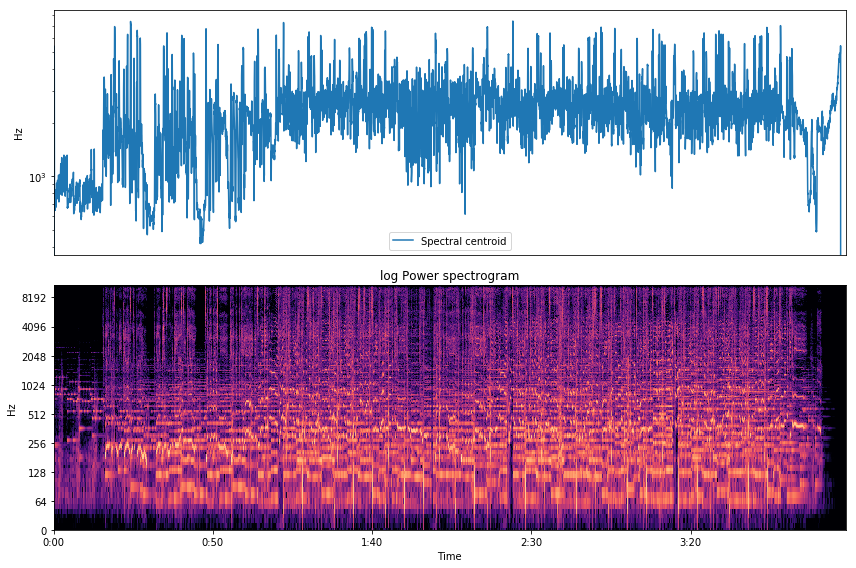

In [17]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.semilogy(spectral_cent.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, spectral_cent.shape[-1]])
plt.legend()
plt.subplot(2, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                          y_axis='log', x_axis='time')
plt.title('log Power spectrogram')
plt.tight_layout()

### 8. 频谱带宽
#### 频谱带宽 spectral_bandwidth: 是衡量音频频域范围的指标
#### 返回 ( 1 * 时间序列长度 )

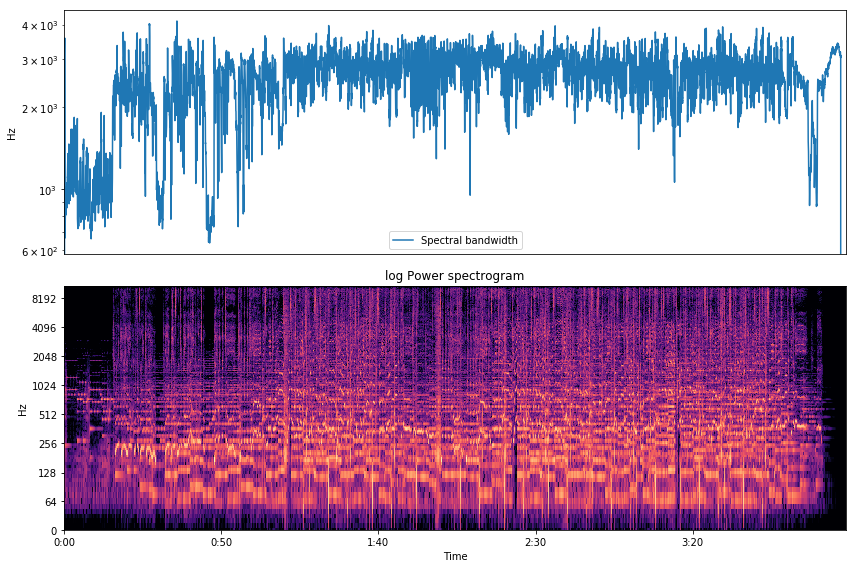

In [18]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.semilogy(spectral_bandwidth.T, label='Spectral bandwidth')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, spectral_bandwidth.shape[-1]])
plt.legend()
plt.subplot(2, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                          y_axis='log', x_axis='time')
plt.title('log Power spectrogram')
plt.tight_layout()

### 9. 频谱对比
#### 返回 ( ７ * 时间序列长度 )
#### 每行光谱对比度值对应于给定的基于八度音程的频率

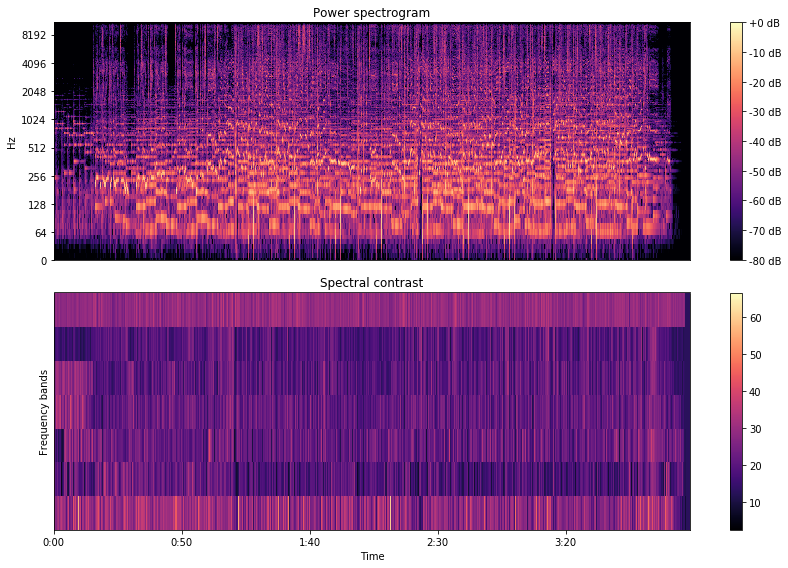

In [19]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max), y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Power spectrogram')
plt.subplot(2, 1, 2)
librosa.display.specshow(spectral_contrast, x_axis='time')
plt.colorbar()
plt.ylabel('Frequency bands')
plt.title('Spectral contrast')
plt.tight_layout()

### 10.频谱平坦度
#### 频谱平坦度（或音调系数）是量化声音噪声的量度，与音调类似 频谱平坦度越高(接近于1.0) 越接近于白噪声
#### 通常转化为分贝
#### 返回类型为( 1 * 时间序列长度 )

### 11.滚降频率
#### 为每个帧定义滚降频率作为频谱图区间的中心频率，使得该帧中的频谱能量的最小滚动百分比(默认为85%)包含在该区间和下面的区间
#### 返回( 1 * 时间序列长度 )

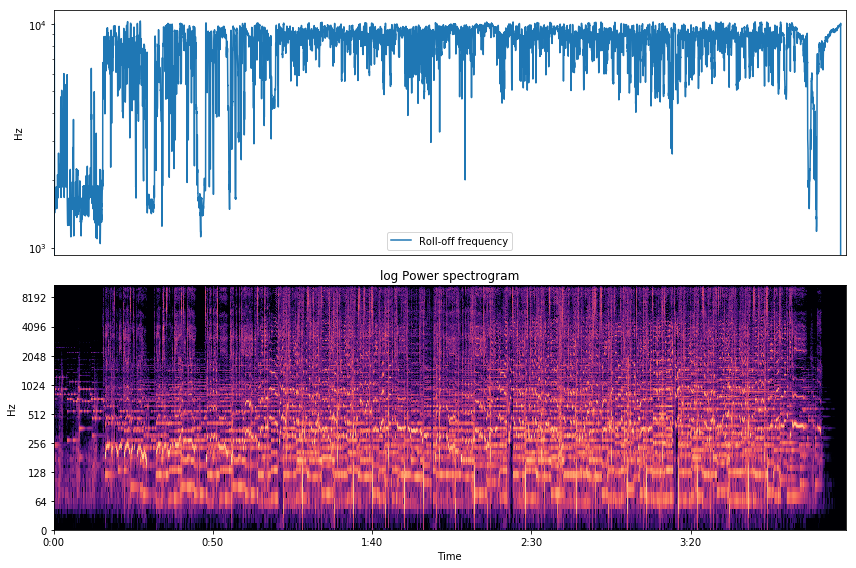

In [20]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.semilogy(spectral_rolloff.T, label='Roll-off frequency')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, spectral_rolloff.shape[-1]])
plt.legend()
plt.subplot(2, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                         y_axis='log', x_axis='time')
plt.title('log Power spectrogram')
plt.tight_layout()

### 12. poly_features 多项式系数
#### 获得将n阶多项式拟合到谱图列的系数
#### 返回 ( 1 * 时间序列长度 )

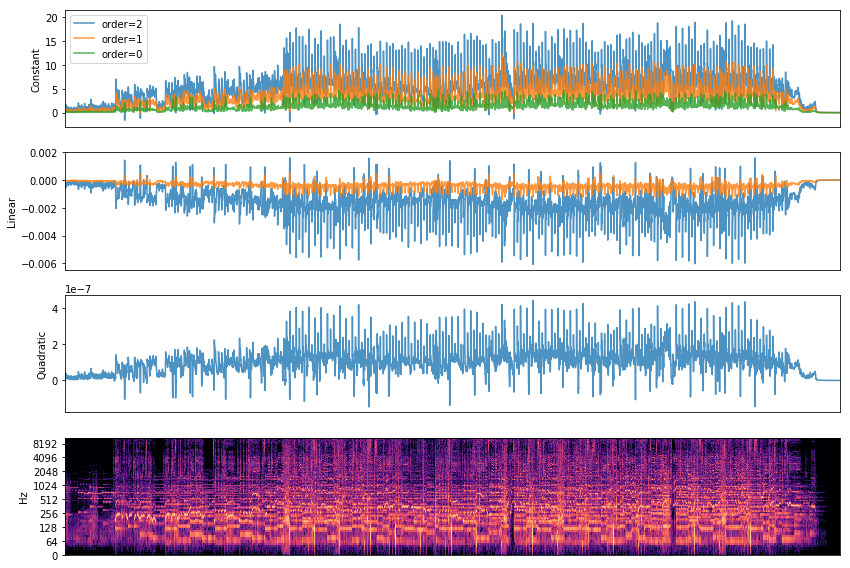

In [21]:
plt.figure(figsize=(12, 8))
ax = plt.subplot(4,1,1)
plt.plot(p2[2], label='order=2', alpha=0.8)
plt.plot(p1[1], label='order=1', alpha=0.8)
plt.plot(p0[0], label='order=0', alpha=0.8)
plt.xticks([])
plt.ylabel('Constant')
plt.legend()
plt.subplot(4,1,2, sharex=ax)
plt.plot(p2[1], label='order=2', alpha=0.8)
plt.plot(p1[0], label='order=1', alpha=0.8)
plt.xticks([])
plt.ylabel('Linear')
plt.subplot(4,1,3, sharex=ax)
plt.plot(p2[0], label='order=2', alpha=0.8)
plt.xticks([])
plt.ylabel('Quadratic')
plt.subplot(4,1,4, sharex=ax)
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                          y_axis='log')
plt.tight_layout()

### 13. 音调质心特征
#### 返回( 6 * 时间序列长度 )

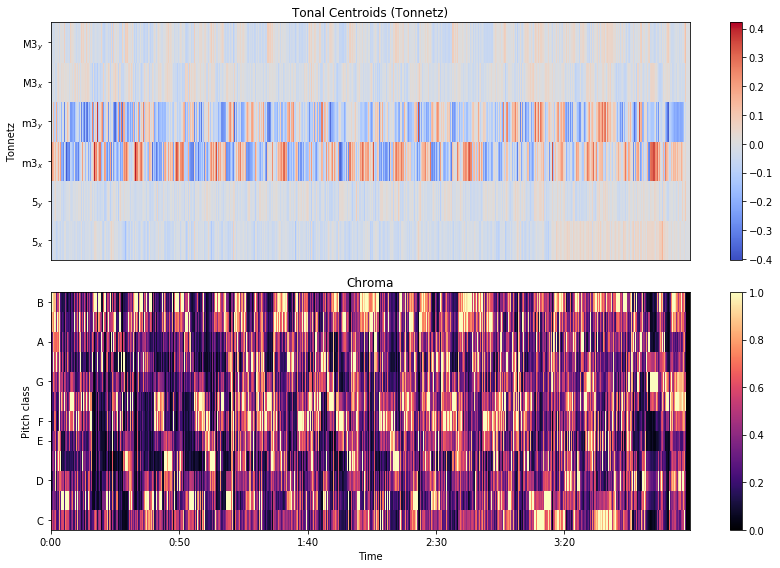

In [22]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
librosa.display.specshow(tonnetz, y_axis='tonnetz')
plt.colorbar()
plt.title('Tonal Centroids (Tonnetz)')
plt.subplot(2, 1, 2)
librosa.display.specshow(librosa.feature.chroma_cqt(y, sr=sr),
                         y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chroma')
plt.tight_layout()

### 14. 过零率
#### 是描述过零量的度, 是信号频率量的一个简单度量
#### 返回( 1 * 时间序列长度 )

# -------------------分割线----------------------- 

## 按照时间序列归一化
####  把原始时间序列分为10000个区间 (还是有损) 首先计算全局方差  取全局方差的35% 作为标准方差
#### 接着按照每个区间的方差 与标准对比 若小于 则取区间内均值 反之则取中位数

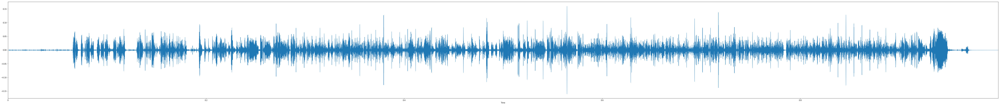

In [23]:
step = 10000
seg = int(len(y)/step)
Normalized_y = []

var = np.var(y)
standard = var*0.35

for i in range(0, 10000):
    start_step = i*seg
    end_step = (i+1)*seg-1
    var_ = np.var(y[start_step:end_step])
    if var_ < standard:
        mean = np.mean(y[start_step:end_step])
        Normalized_y.append(mean)
    else :
        med = np.median(y[start_step:end_step])
        Normalized_y.append(med)
        
Normalized_y = np.array(Normalized_y)
plt.figure(figsize=(100, 10))
librosa.display.waveplot(Normalized_y, 10000)

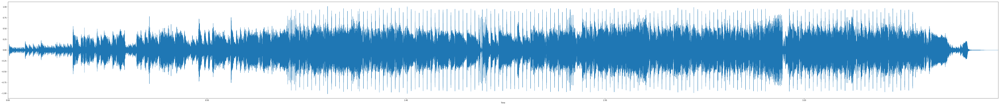

In [24]:
plt.figure(figsize=(100, 10))
librosa.display.waveplot(y, sr)

计算每个向量的平均值, 最大值, 最小值

In [25]:
for i in zero_crossing_rate:
    print("{0}\t{1}\t{2}".format(np.mean(i), np.max(i), np.min(i)))

0.09719905030800821	0.703125	0.0


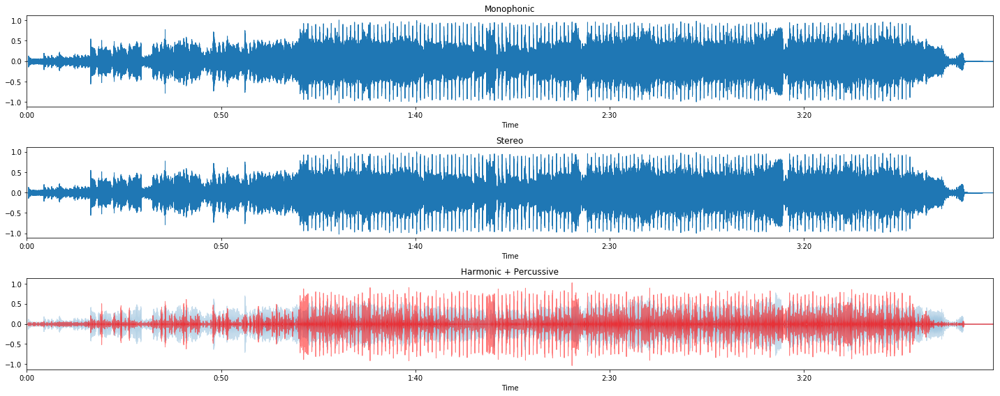

In [26]:
plt.figure(figsize=(20, 8))
plt.subplot(3, 1, 1)
librosa.display.waveplot(y, sr=sr)
plt.title('Monophonic')

#y, sr = librosa.load(librosa.util.example_audio_file(), mono=False, duration=10)
plt.subplot(3, 1, 2)
librosa.display.waveplot(y, sr=sr)
plt.title('Stereo')

#y, sr = librosa.load(librosa.util.example_audio_file(), duration=10)
y_harm, y_perc = librosa.effects.hpss(y)
plt.subplot(3, 1, 3)
librosa.display.waveplot(y_harm, sr=sr, alpha=0.25)
librosa.display.waveplot(y_perc, sr=sr, color='r', alpha=0.5)
plt.title('Harmonic + Percussive')
plt.tight_layout()

### 节奏波形图

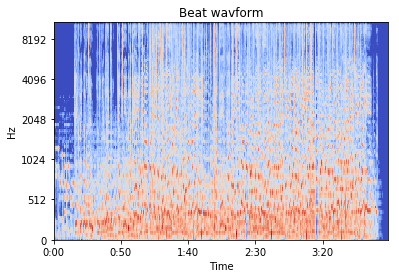

In [27]:
melspec = librosa.feature.melspectrogram(y, sr, n_fft=1024, hop_length=512, n_mels=128)
# convert to log scale
logmelspec = librosa.power_to_db(melspec)
# plot mel spectrogram
plt.figure()
librosa.display.specshow(logmelspec, sr=sr, x_axis='time', y_axis='mel')
plt.title('Beat wavform')
plt.show()

### 节拍图
#### 起始强度包络的局部自相关

In [4]:
# 计算局部起始自相关
hop_length = 512
oenv = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr, hop_length=hop_length)
ac_global = librosa.autocorrelate(oenv, max_size=tempogram.shape[0])
ac_global = librosa.util.normalize(ac_global)
# 显示预测到的全局速度
tempo = librosa.beat.tempo(onset_envelope=oenv, sr=sr, hop_length=hop_length)[0]

/home/bob/anaconda3/lib/python3.7/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


In [9]:
tempo

89.10290948275862

(-535.65, 11248.65, -1.0124134991660074, 21.260683482486154)

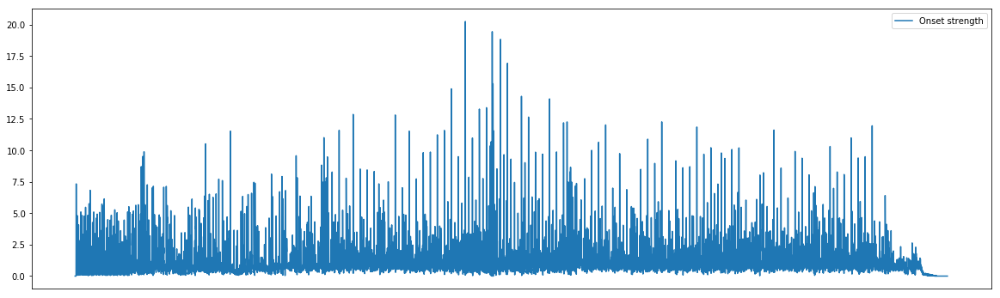

In [32]:
plt.figure(figsize=(20, 6))
#plt.subplot(4, 1, 1)
plt.plot(oenv, label='Onset strength')
plt.xticks([])
plt.legend(frameon=True)
plt.axis('tight')

In [ ]:
#plt.subplot(4, 1, 2)
# We'll truncate the display to a narrower range of tempi
librosa.display.specshow(tempogram, sr=sr, hop_length=hop_length,
                         x_axis='time', y_axis='tempo')
plt.axhline(tempo, color='w', linestyle='--', alpha=1,
            label='Estimated tempo={:g}'.format(tempo))
plt.legend(frameon=True, framealpha=0.75)

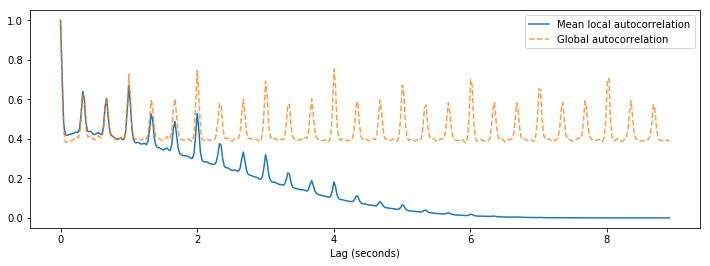

In [7]:
#plt.subplot(4, 1, 3)
plt.figure(figsize=(12, 4))
x = np.linspace(0, tempogram.shape[0] * float(hop_length) / sr,
                num=tempogram.shape[0])
plt.plot(x, np.mean(tempogram, axis=1), label='Mean local autocorrelation')
plt.plot(x, ac_global, '--', alpha=0.75, label='Global autocorrelation')
plt.xlabel('Lag (seconds)')
plt.axis('tight')
plt.legend(frameon=True)

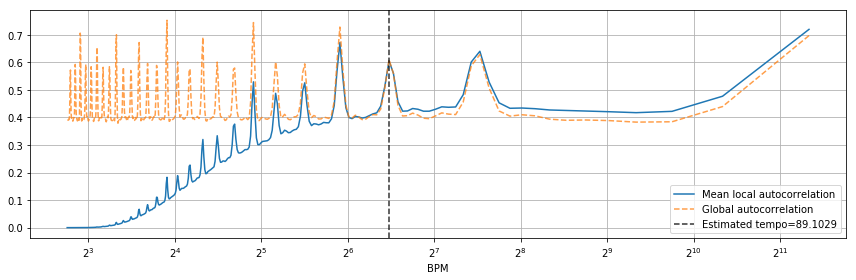

In [8]:
#plt.subplot(4,1,4)
# We can also plot on a BPM axis
plt.figure(figsize=(12, 4))
freqs = librosa.tempo_frequencies(tempogram.shape[0], hop_length=hop_length, sr=sr)
plt.semilogx(freqs[1:], np.mean(tempogram[1:], axis=1),
             label='Mean local autocorrelation', basex=2)
plt.semilogx(freqs[1:], ac_global[1:], '--', alpha=0.75,
             label='Global autocorrelation', basex=2)
plt.axvline(tempo, color='black', linestyle='--', alpha=.8,
            label='Estimated tempo={:g}'.format(tempo))
plt.legend(frameon=True)
plt.xlabel('BPM')
plt.axis('tight')
plt.grid()
plt.tight_layout()

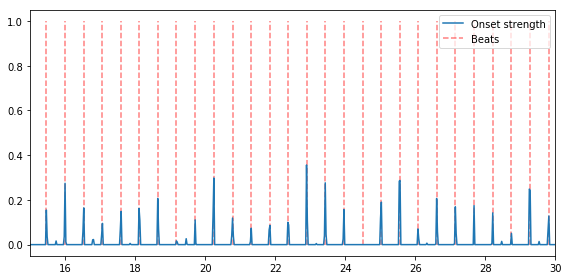

In [257]:
plt.figure(figsize=(8, 4))
onset_env = librosa.onset.onset_strength(y, sr=sr, aggregate=np.median)
times = librosa.frames_to_time(np.arange(len(onset_env)),
                               sr=sr, hop_length=512)
plt.plot(times, librosa.util.normalize(onset_env),
         label='Onset strength')
plt.vlines(times[beats], 0, 1, alpha=0.5, color='r',
           linestyle='--', label='Beats')
plt.legend(frameon=True, framealpha=0.75)
# Limit the plot to a 15-second window
plt.xlim(15, 30)
plt.gca().xaxis.set_major_formatter(librosa.display.TimeFormatter())
plt.tight_layout()

(24.3444524653937,
 3226.7166457958742,
 -0.00614859583988641,
 0.5781642674326278)

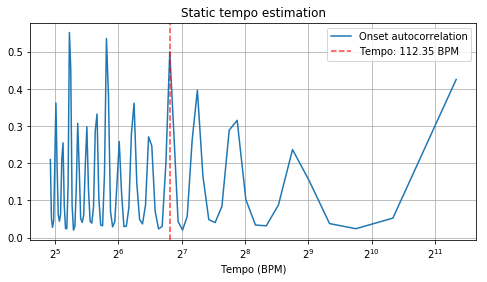

In [258]:

# Convert to scalar
tempo = np.asscalar(tempo)
# Compute 2-second windowed autocorrelation
hop_length = 512
ac = librosa.autocorrelate(onset_env, 2 * sr // hop_length)
freqs = librosa.tempo_frequencies(len(ac), sr=sr,
                                   hop_length=hop_length)
# Plot on a BPM axis.  We skip the first (0-lag) bin.
plt.figure(figsize=(8,4))
plt.semilogx(freqs[1:], librosa.util.normalize(ac)[1:],
              label='Onset autocorrelation', basex=2)
plt.axvline(tempo, 0, 1, color='r', alpha=0.75, linestyle='--',
            label='Tempo: {:.2f} BPM'.format(tempo))
plt.xlabel('Tempo (BPM)')
plt.grid()
plt.title('Static tempo estimation')
plt.legend(frameon=True)
plt.axis('tight')

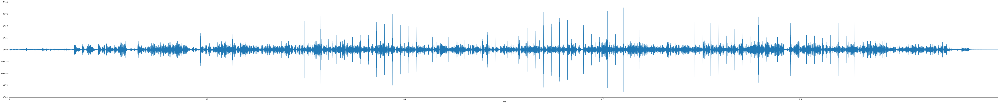

In [9]:
step = 10000
seg = int(len(y)/step)
Normalized_y = []

for i in range(0, 10000):
    start_step = i*seg
    end_step = (i+1)*seg-1
    var = np.var(y[start_step:end_step])
    mean = np.mean(y[start_step:end_step])
    Normalized_y.append(mean)
    
Normalized_y = np.array(Normalized_y)
plt.figure(figsize=(100, 10))
librosa.display.waveplot(Normalized_y, 10000)

In [157]:
ipd.Audio(data=y, rate=sr)

# 存在的问题
## 1.时间序列归一化的问题, 是否需要截取等长时间段保持时间长短一致?
## 2.如何处理多维特征矩阵?
## 3.如何分类?
## 4.一首歌的分析时间大约为2分钟
## 5.如何构建数据集?
## 6.纵坐标为音色( ABCDEF ) 时 需不需要统计色度大小?
## 7.纵坐标为Hz时 如何进行处理
